In [2]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
import normflows as nf
import matplotlib.pyplot as plt
import torch
import numpy as np
from torch.optim import Adam
from torch.utils.data import TensorDataset, DataLoader
from fab import FABModel, HamiltonianMonteCarlo, Metropolis
from fab.utils.logging import ListLogger
from fab.utils.plotting import plot_history, plot_contours, plot_marginal_pair
from fab.target_distributions.gmm import GMM
from fab.utils.prioritised_replay_buffer import SimpleBuffer
from torch.autograd import grad
from fab.utils.plotting import plot_contours, plot_marginal_pair
from experiments.make_flow import make_wrapped_normflow_realnvp
import models.ddpm
import models.mlp
import pdb
from tqdm import tqdm
from models.ddpm import GaussianDiffusion, TMLP
from models.mlp import MyMLP, SpectralNormMLP

import torch
import torchsde

from functorch import vmap

from torchdiffeq import odeint

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


### Target Distribution

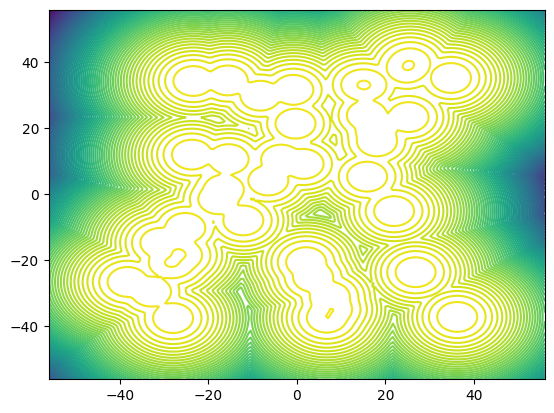

In [5]:
dim = 2
n_mixes = 40
loc_scaling = 40.0  # scale of the problem (changes how far apart the modes of each Guassian component will be)
log_var_scaling = 1.0 # variance of each Gaussian
seed = 0


if device == "cpu":
    use_gpu = False
else:
    use_gpu = True
torch.manual_seed(0)  # seed of 0 for GMM problem
target = GMM(dim=dim, n_mixes=n_mixes,
              loc_scaling=loc_scaling, log_var_scaling=log_var_scaling,
              use_gpu=use_gpu, true_expectation_estimation_n_samples=int(1e5))
# plot target
target.to("cpu")
fig, ax = plt.subplots()
plotting_bounds = (-loc_scaling * 1.4, loc_scaling * 1.4)
plot_contours(target.log_prob, bounds=plotting_bounds, n_contour_levels=80, ax=ax, grid_width_n_points=200)
target.to(device)

### Helper Functions

In [6]:
def plot_dataset(samples, gen_samples=None):
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    target.to("cpu")
    plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[0], n_contour_levels=50, grid_width_n_points=200)

   
    # plot dataset samples
    plot_marginal_pair(samples, ax=axs[0], bounds=plotting_bounds)
    axs[0].set_title("Buffer")

    if gen_samples is not None:
        plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[1], n_contour_levels=50, grid_width_n_points=200)
        # plot generated samples
        plot_marginal_pair(gen_samples, ax=axs[1], bounds=plotting_bounds)
        axs[1].set_title("Generated samples")

    else:
        #delete subplot
        fig.delaxes(axs[1])
        
    target.to(device)
    plt.show()
    return [fig]

In [7]:
def normalize(x):
    '''
        normalizes to [-1, 1]
    '''
    mins = -50 #torch.min(x, dim=0)[0]
    maxs = 50 #torch.max(x, dim=0)[0]
    ## [ 0, 1 ]
    x = (x - mins) / (maxs - mins + 1e-5)
    ## [ -1, 1 ]
    x = x * 2 - 1
    
    return x, mins, maxs

def unnormalize(x, mins, maxs):
    '''
        x : [ -1, 1 ]
    '''
    # assert x.max() <= 1 and x.min() >= -1, f'x range: ({x.min():.4f}, {x.max():.4f})'
    #x = x * std + mean
    x = (x + 1) / 2
    return x * (maxs - mins) + mins

## Function Definitions

### Estimated Reward Functions

In [8]:
# calculate the log expectation of the reward
def log_E_R(_x, _t, beta, num_mc_samples, global_mins=-50, global_maxs=50, var_exploding=True):
    h_t = beta * _t.repeat_interleave(num_mc_samples).unsqueeze(1)
    repeated_x = _x.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    repeated_t = _t.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    h_t  = beta * repeated_t
    h_t = h_t.unsqueeze(1)
    if var_exploding:
        # variance exploding
        samples = repeated_x + torch.randn(repeated_x.shape).to(device) * (h_t ** 0.5)
        log_rewards = target.log_prob(unnormalize(samples, global_mins, global_maxs))
        log_expectation_R = torch.logsumexp(log_rewards, dim=-1) - np.log(num_mc_samples)
    else:
        # variance preserving
        samples = repeated_x/torch.sqrt(1 - repeated_t.unsqueeze(1)) + torch.randn(repeated_x.shape).to(device) * (h_t ** 0.5)
        log_rewards = target.log_prob(unnormalize(samples, global_mins, global_maxs))
        log_expectation_R = torch.log(1 / (1 - _t)) + torch.logsumexp(log_rewards, dim=-1) - np.log(num_mc_samples)
    return log_expectation_R

In [9]:
def estimated_Rt(x, t, beta, num_mc_samples=100, var_exploding=True):
    if t.dim() == 0:
        # repeat the same time for all points if we have a scalar time
        t = t * torch.ones(x.shape[0]).to(device)
    return torch.vmap(log_E_R, 
                      randomness='different', in_dims=(0,0,None,None))(x, t, beta, num_mc_samples, var_exploding=var_exploding)

In [10]:
def estimate_grad_Rt(x, t, beta, num_mc_samples=200, var_exploding=True, richardson=False):
    est_scores_n = torch.vmap(torch.func.grad(log_E_R), 
                            in_dims=(0,0,None,None), randomness='different')(x, t, beta, num_mc_samples, 
                                                                                  var_exploding=var_exploding)
    if richardson:
        est_scores_n_div2 = torch.vmap(torch.func.grad(log_E_R), 
                                   in_dims=(0,0,None,None), randomness='different')(x, t, beta, num_mc_samples//2, 
                                                                                         var_exploding=var_exploding)
        return (2*est_scores_n - est_scores_n_div2)
    else:
        return est_scores_n

### True Reward Functions

In [11]:
def true_Rt(x, t, beta, global_mins=-50, global_maxs=50, var_exploding=True):
    h_t = beta * t
    target.convolve(h_t * (global_maxs **2), t, var_exploding=var_exploding)
    energy = target.log_prob(unnormalize(x, global_mins, global_maxs))
    target.reset()
    return energy

In [12]:
def true_grad_Rt(x, t, beta, var_exploding=True):
    samples_energy = true_Rt(x, t[0], beta, var_exploding=var_exploding)
    true_scores = torch.autograd.grad(samples_energy.sum(), x, retain_graph=True)[0].detach()
    return true_scores

## SDE Tests

### Dataset

In [13]:
# hyper-parameters

# Flow
n_flow_layers = 15
layer_nodes_per_dim = 40
lr = 1e-4
max_gradient_norm = 100.0
batch_size = 128
n_iterations = 4000
n_eval = 10
eval_batch_size = batch_size * 10
n_plots = 10 # number of plots shows throughout tranining
use_64_bit = True
alpha = 2.0
num_samples = 10000

flow = make_wrapped_normflow_realnvp(dim, n_flow_layers=n_flow_layers, 
                                 layer_nodes_per_dim=layer_nodes_per_dim,
                                act_norm = False)

/home/mila/t/tara.akhoundsadegh/.conda/envs/actinfenv/lib/python3.10/site-packages/torch/_tensor.py:677: UserWarning: torch.lu is deprecated in favor of torch.linalg.lu_factor / torch.linalg.lu_factor_ex and will be removed in a future PyTorch release.
LU, pivots = torch.lu(A, compute_pivots)
should be replaced with
LU, pivots = torch.linalg.lu_factor(A, compute_pivots)
and
LU, pivots, info = torch.lu(A, compute_pivots, get_infos=True)
should be replaced with
LU, pivots, info = torch.linalg.lu_factor_ex(A, compute_pivots) (Triggered internally at ../aten/src/ATen/native/BatchLinearAlgebra.cpp:1991.)
  LU, pivots, infos = torch._lu_with_info(


In [14]:
# normalize the dataset
init_num_samples = 2048
unnorm_true_samples = target.sample(torch.tensor(init_num_samples).unsqueeze(0)).to(device).detach()
unnorm_init_samples = flow.sample((init_num_samples,)).to(device).detach()
init_energy = target.log_prob(unnorm_init_samples).detach()
init_samples, global_mins_init, global_maxs_init = normalize(unnorm_init_samples)

global_mins_init = -50
global_maxs_init = 50

init_dataset = TensorDataset(init_samples, init_energy)
init_loader = DataLoader(init_dataset, batch_size = 512, shuffle=True) 

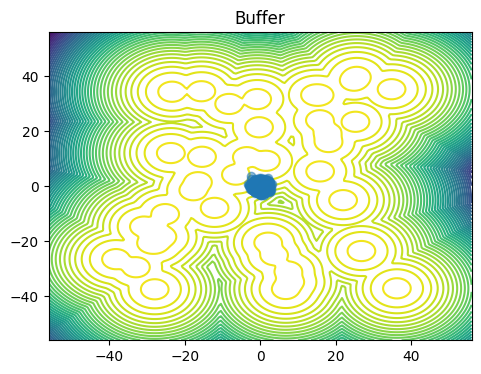

In [15]:
plot_dataset(unnorm_init_samples) # visualise the initial samples
plt.show()

### VE SDE

In [22]:
class VEReverseSDE(torch.nn.Module):
    noise_type = 'diagonal'
    sde_type = 'ito'
    
    def __init__(self, score, beta):
        super().__init__()
        self.score = score
        self.beta = beta
    
    def f(self, t, x):
        with torch.enable_grad():
            if t.dim() == 0:
                # repeat the same time for all points if we have a scalar time
                t = t * torch.ones(x.shape[0]).to(device)

            x.requires_grad = True
            score = self.score(x, 1-t, self.beta)
        return self.g(t, x)**2 * score 
    
    def g(self, t, x):
        return torch.full_like(x, self.beta ** 0.5)

In [23]:
def generate_samples(ve_reverse_sde, x_init):
    t = torch.linspace(0.001, 1.0, 500).to(device)
    with torch.no_grad():
        samples = torchsde.sdeint(ve_reverse_sde, x_init, t)
    return samples

In [24]:
def euler_maruyama_step(sde, x, t, dt):
    # Calculate drift and diffusion terms
    drift = sde.f(t, x) * dt
    diffusion = sde.g(t, x) * np.sqrt(dt) * torch.randn_like(x).to(device)

    # Update the state
    x_next = x + drift + diffusion
    return x_next, drift

def integrate_sde(sde, x0, t_span, dt):
    times = torch.arange(t_span[0], t_span[1], dt).to(device)
    x = x0
    x0.requires_grad = True
    pred_v = []
    true_v = []
    samples = []
    with torch.no_grad():
        for t in times:
            x, f = euler_maruyama_step(sde, x, t, dt)
            samples.append(x)
            pred_v.append(f)
            # true_v.append(true_grad_Rt(x, 1-t, beta))
    return torch.stack(samples), torch.stack(pred_v) # , torch.stack(true_v)

In [38]:
num_samples = 256 #512
beta = 0.2

with torch.no_grad():
    target.convolve(torch.tensor(10000, device=torch.device('cpu')), 1)
    x1_samples = target.sample((num_samples,))
    target.reset()
    x1_samples_normalized = normalize(x1_samples)[0]

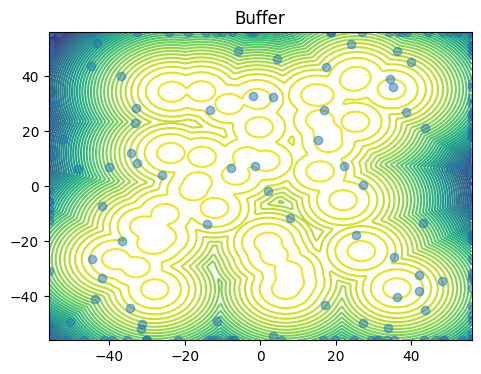

[<Figure size 1200x400 with 1 Axes>]

In [39]:
plot_dataset(x1_samples)

In [41]:
# ve_reverse_sde = VEReverseSDE(true_grad_Rt, beta)
ve_reverse_sde = VEReverseSDE(estimate_grad_Rt, beta)
# samples = generate_samples(ve_reverse_sde, x1_samples_normalized)
samples, pred_vectors = integrate_sde(ve_reverse_sde, x1_samples_normalized, [0, 1], 0.001) #true_vectors

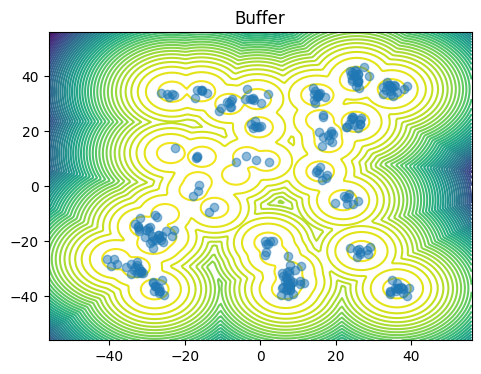

[<Figure size 1200x400 with 1 Axes>]

In [45]:
plot_dataset(unnormalize(samples[-1], global_mins_init, global_maxs_init))

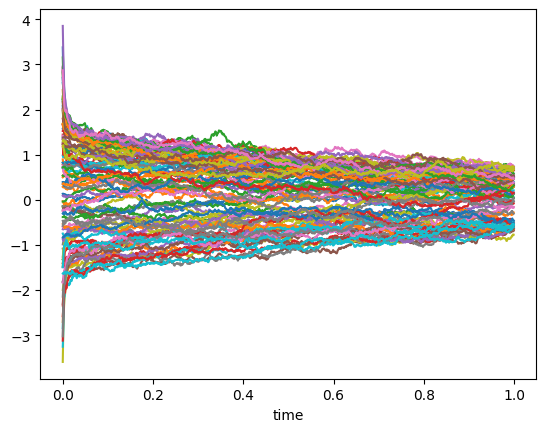

In [50]:
plt.plot(torch.arange(0, 1, 0.001), samples[:, :100, 0].detach().cpu())
plt.xlabel('time')
plt.show()

In [46]:
ve_reverse_sde = VEReverseSDE(true_grad_Rt, beta)
# samples = generate_samples(ve_reverse_sde, x1_samples_normalized)
true_samples, true_vectors = integrate_sde(ve_reverse_sde, x1_samples_normalized, [0, 1], 0.001) #true_vectors

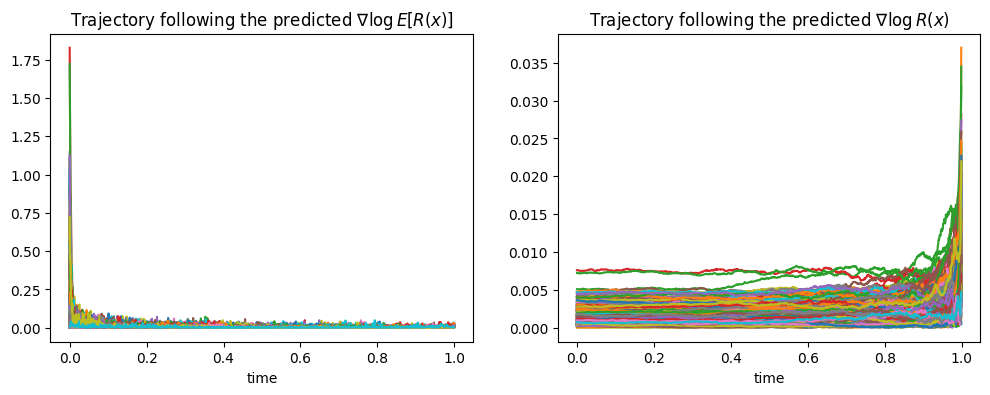

In [47]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))
# predicted 
traj_pred = torch.cumsum(pred_vectors, dim=-1)
axs[0].plot(torch.arange(0, 1, 0.001), torch.linalg.norm(traj_pred[:,:200], dim=-1).cpu())
axs[0].set_xlabel("time")
axs[0].set_title(r"Trajectory following the predicted $\nabla \log E[R(x)]$")


# true
traj_true = torch.cumsum(true_vectors, dim=-1)
axs[1].plot(torch.arange(0, 1, 0.001), torch.linalg.norm(traj_true[:,:200], dim=-1).cpu())
axs[1].set_xlabel("time")
axs[1].set_title(r"Trajectory following the predicted $\nabla \log R(x)$")

plt.show()

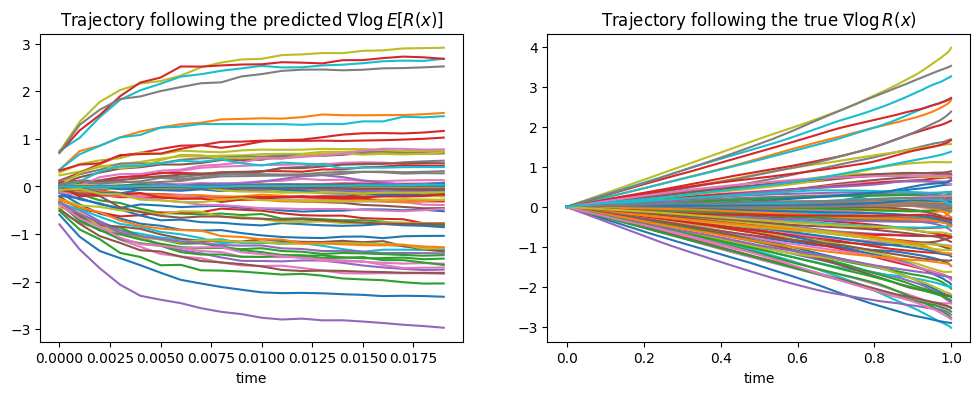

In [53]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

# predicted 
# plt.plot(torch.arange(0, 1, 0.001), torch.cumsum(traj_norm_pred, dim=0).cpu())
axs[0].plot(torch.arange(0, 1, 0.001)[:20], torch.cumsum(pred_vectors[:20, :100, 0], dim=0).cpu())
axs[0].set_xlabel("time")
axs[0].set_title(r"Trajectory following the predicted $\nabla \log E[R(x)]$")


# true
# plt.plot(torch.arange(0, 1, 0.001), torch.cumsum(traj_norm_true, dim=0).cpu())
axs[1].plot(torch.arange(0, 1, 0.001), torch.cumsum(true_vectors[:, :100, 0], dim=0).cpu())
axs[1].set_xlabel("time")
axs[1].set_title(r"Trajectory following the true $\nabla \log R(x)$")

plt.show()

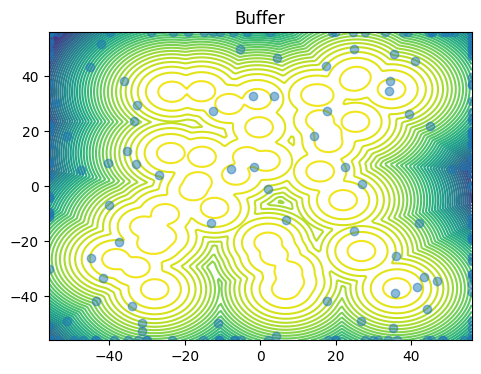

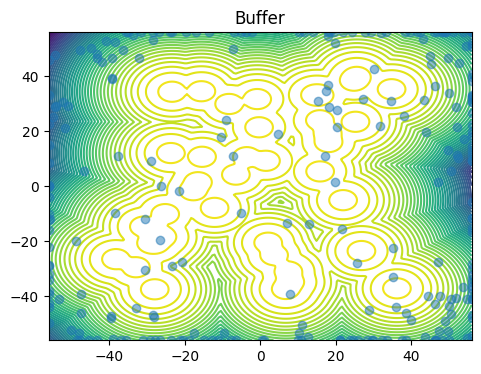

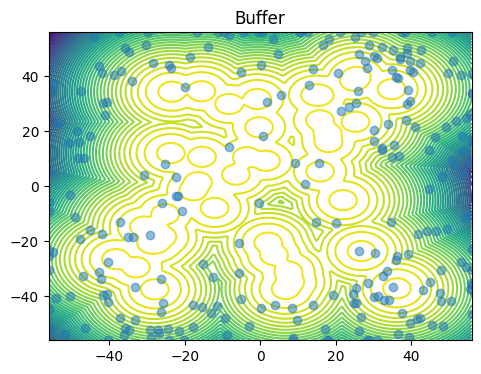

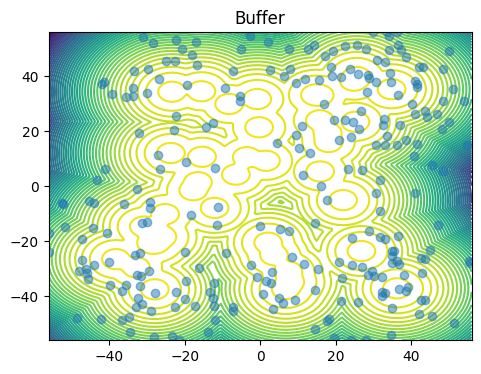

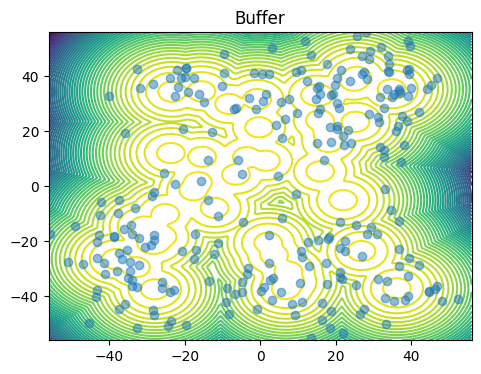

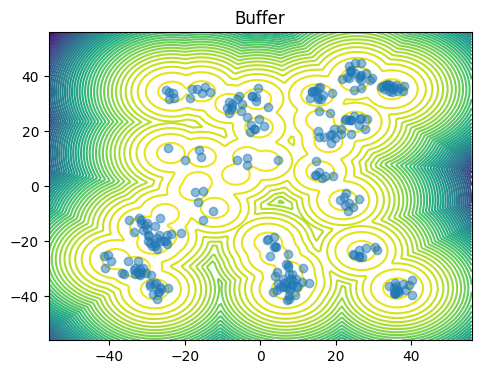

In [55]:
for i in range(0, true_samples.shape[0], 199):
    plot_dataset(unnormalize(samples[i], global_mins_init, global_maxs_init))

### Training

In [ ]:
def reward_matching_loss_biased(vectorfield, x, t, beta):     
    t = t.unsqueeze(1)
    h_t = beta * t
    # pdb.set_trace()?
    x.requires_grad = True

    # noisy sample: x(t)
    noisy_x = torch.normal(x, h_t ** 0.5)
    pred_scores = vectorfield(noisy_x, t.squeeze())

    estimated_scores = estimate_grad_Rt(noisy_x, t.squeeze(), beta)
    return ((estimated_scores - pred_scores)**2).mean()

In [ ]:
beta = 0.2
vectorfield = MyMLP().to(device)
opt_vectorfield = Adam(vectorfield.parameters(), lr=1e-4)

In [ ]:
buffer = SimpleBuffer(2, 10000, 1000, initial_sampler=None, 
                      device=device, fill_buffer_during_init=False, sample_with_replacement=True)


x1_energy = target.log_prob(x1_samples).detach()
buffer.add(x1_samples_normalized, x1_energy)

Buffer not initialised, expected that checkpoint will be loaded.


  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 0 | Loss 56227.601562
Epoch 49 | Loss 54274.316406
Epoch 98 | Loss 51131.679688


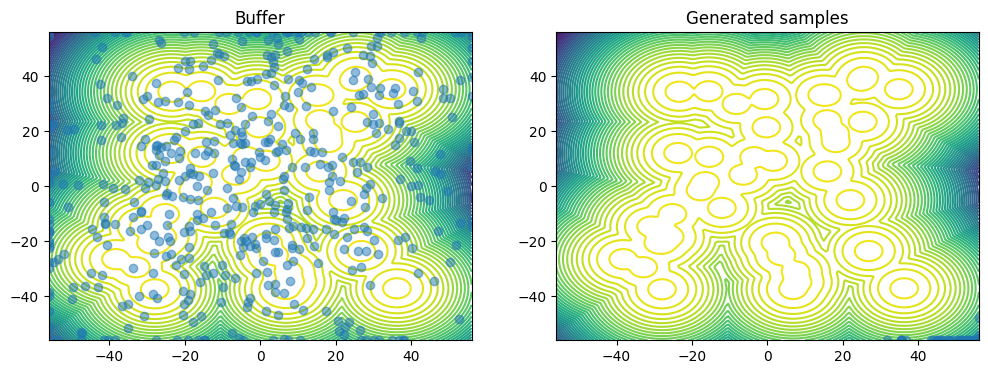

  1%|          | 1/100 [00:27<45:11, 27.39s/it]

Epoch 0 | Loss 466.596863
Epoch 49 | Loss 233.290985
Epoch 98 | Loss 231.138580


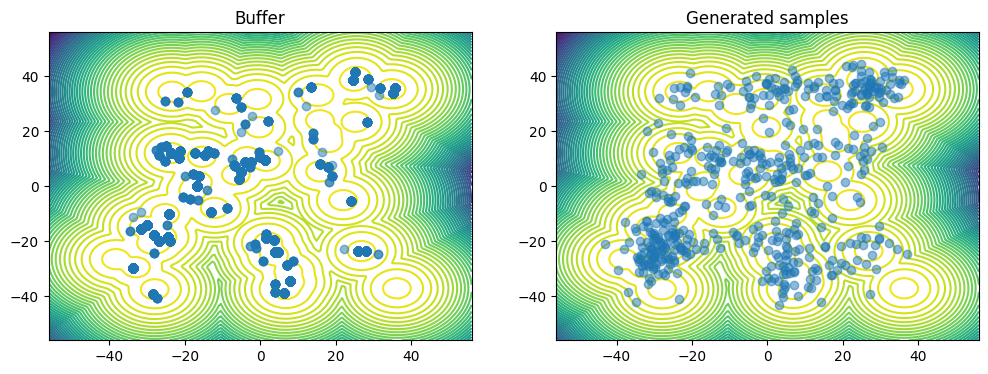

  2%|▏         | 2/100 [01:05<54:49, 33.56s/it]

Epoch 0 | Loss 227.497742
Epoch 49 | Loss 629.488953
Epoch 98 | Loss 189.426727


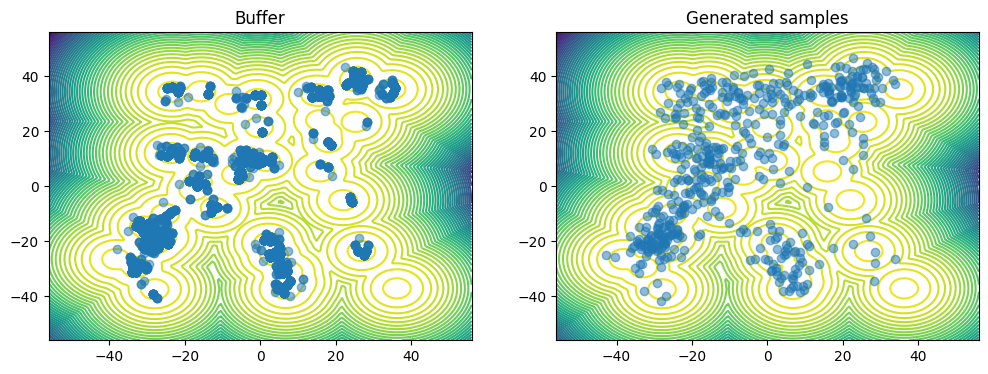

  3%|▎         | 3/100 [01:43<57:26, 35.53s/it]

Epoch 0 | Loss 787.006958
Epoch 49 | Loss 210.088226
Epoch 98 | Loss 151.833542


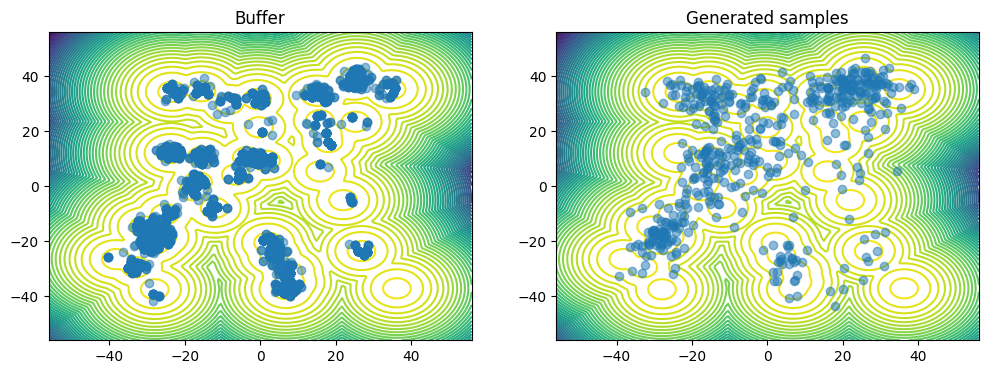

  4%|▍         | 4/100 [02:21<58:30, 36.57s/it]

Epoch 0 | Loss 242.566940
Epoch 49 | Loss 177.361145
Epoch 98 | Loss 151.719086


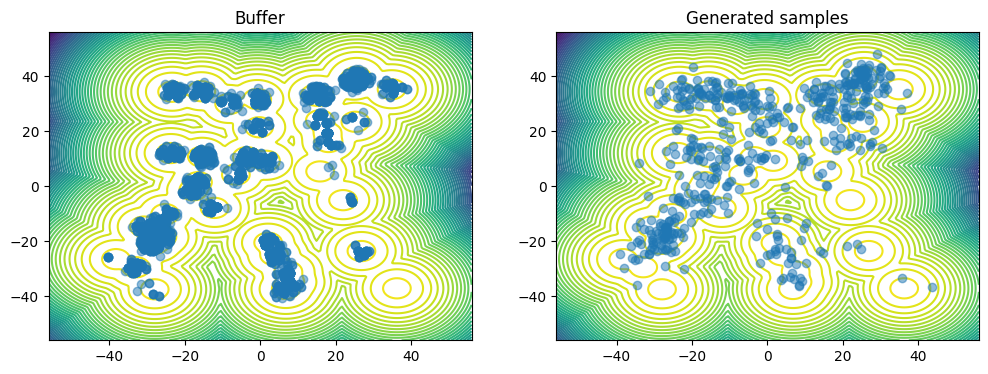

  5%|▌         | 5/100 [02:59<58:47, 37.14s/it]

Epoch 0 | Loss 180.951416
Epoch 49 | Loss 195.239243
Epoch 98 | Loss 424.776001


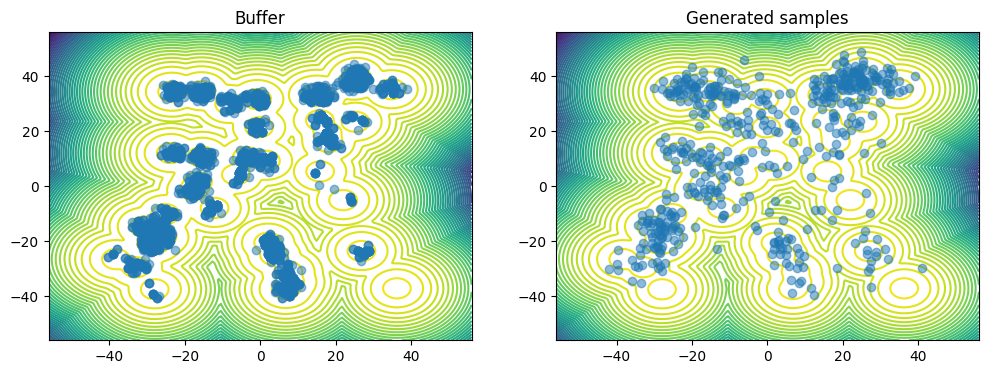

  6%|▌         | 6/100 [03:38<58:59, 37.66s/it]

Epoch 0 | Loss 198.792953
Epoch 49 | Loss 193.493530
Epoch 98 | Loss 199.694443


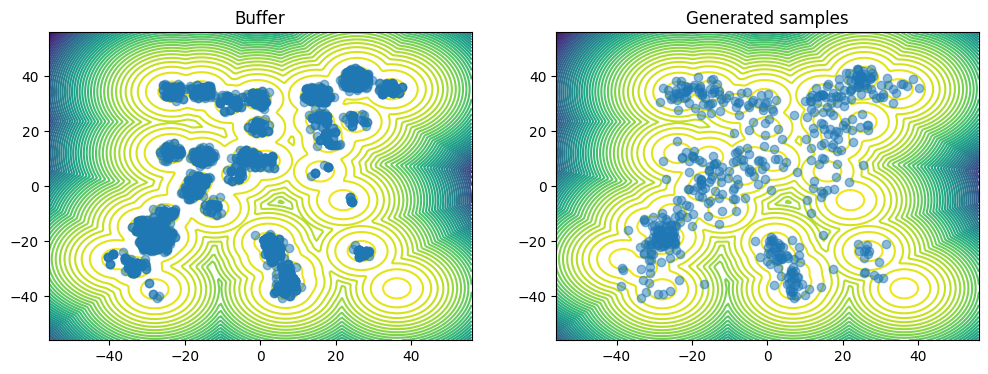

  7%|▋         | 7/100 [04:16<58:31, 37.76s/it]

Epoch 0 | Loss 118.845711
Epoch 49 | Loss 257.992645
Epoch 98 | Loss 169.711365


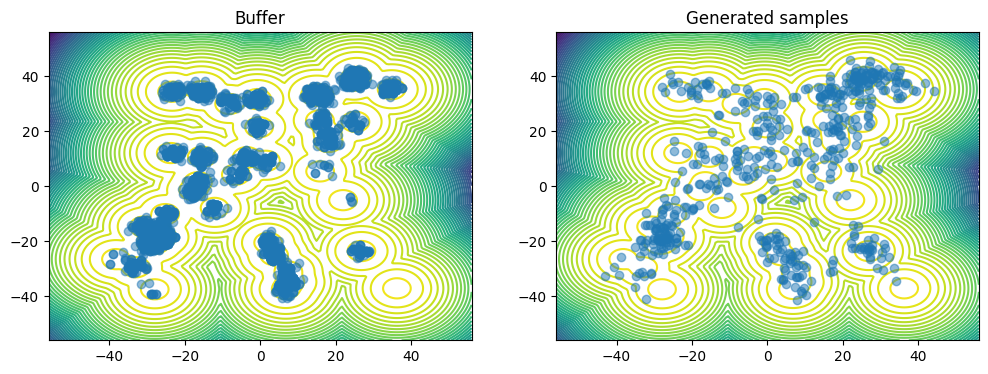

  8%|▊         | 8/100 [04:53<57:49, 37.71s/it]

Epoch 0 | Loss 292.365204
Epoch 49 | Loss 122.839203
Epoch 98 | Loss 276.173431


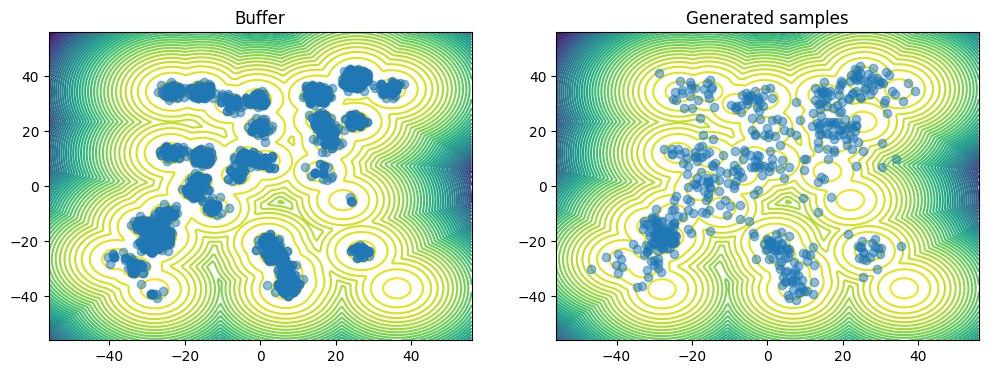

  9%|▉         | 9/100 [05:31<57:14, 37.75s/it]

Epoch 0 | Loss 232.306885
Epoch 49 | Loss 162.675674
Epoch 98 | Loss 127.271416


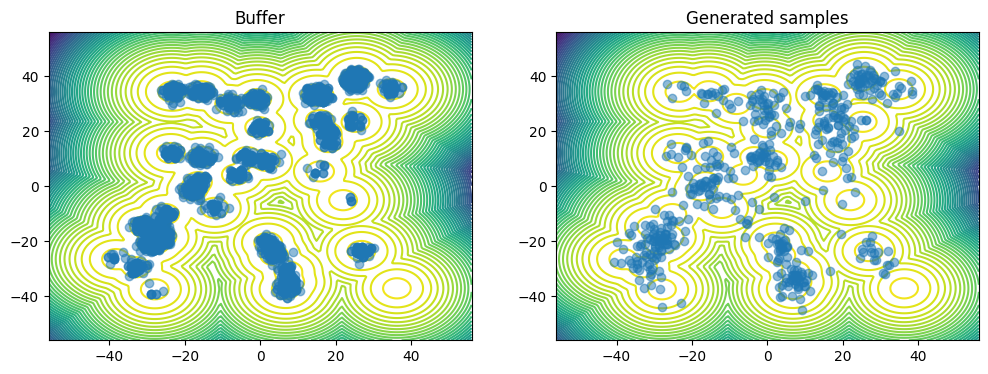

 10%|█         | 10/100 [06:09<56:46, 37.85s/it]

Epoch 0 | Loss 137.881821
Epoch 49 | Loss 110.253662
Epoch 98 | Loss 227.171509


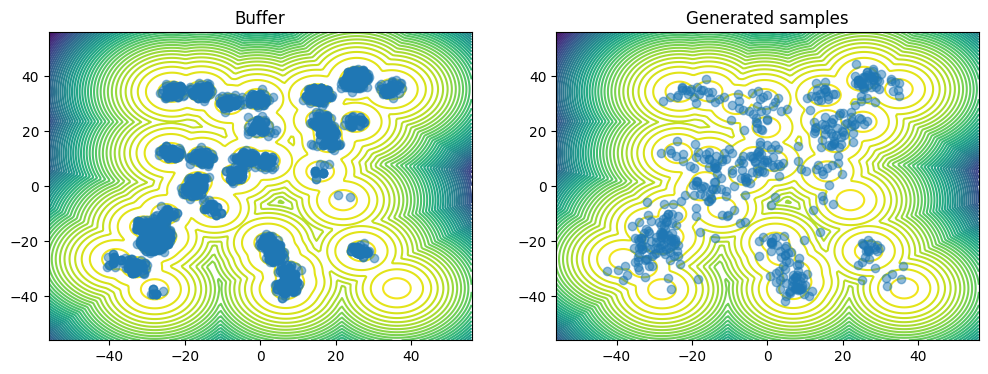

 11%|█         | 11/100 [06:47<56:11, 37.88s/it]

Epoch 0 | Loss 164.181915
Epoch 49 | Loss 217.156921
Epoch 98 | Loss 193.379776


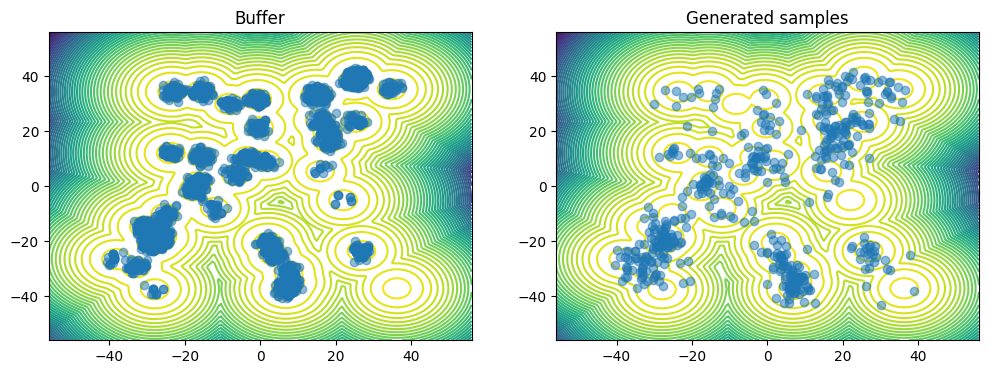

 12%|█▏        | 12/100 [07:25<55:35, 37.90s/it]

Epoch 0 | Loss 286.812714
Epoch 49 | Loss 266.903046
Epoch 98 | Loss 212.783127


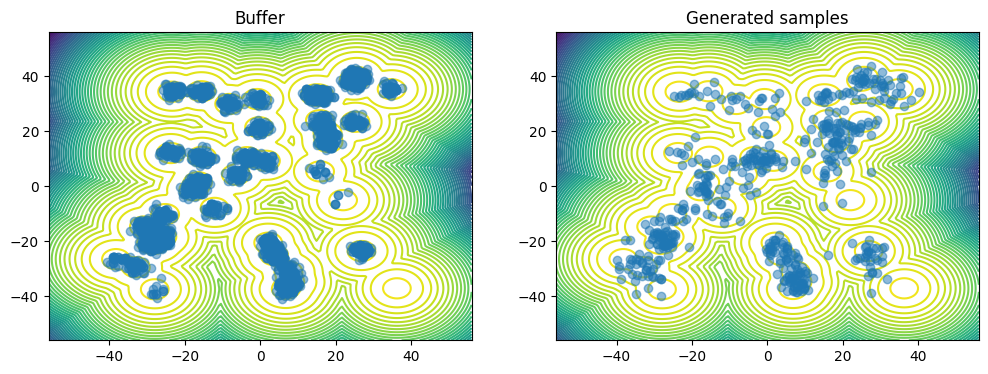

 13%|█▎        | 13/100 [08:03<55:06, 38.01s/it]

Epoch 0 | Loss 114.996010
Epoch 49 | Loss 189.706329
Epoch 98 | Loss 137.869598


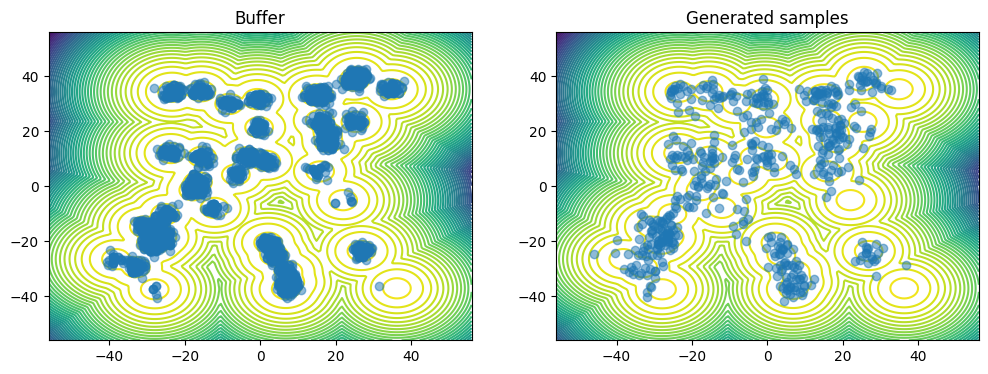

 14%|█▍        | 14/100 [08:41<54:32, 38.05s/it]

Epoch 0 | Loss 230.173706
Epoch 49 | Loss 160.679626
Epoch 98 | Loss 164.276550


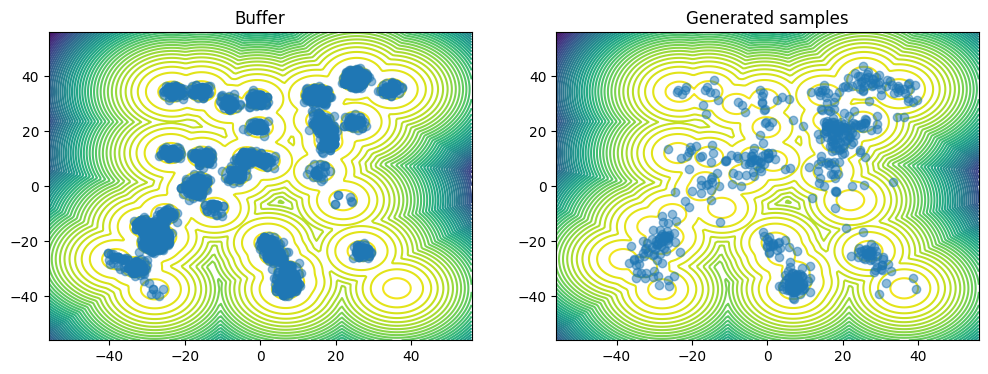

 15%|█▌        | 15/100 [09:19<53:50, 38.00s/it]

Epoch 0 | Loss 181.005341
Epoch 49 | Loss 431.610687
Epoch 98 | Loss 138.763779


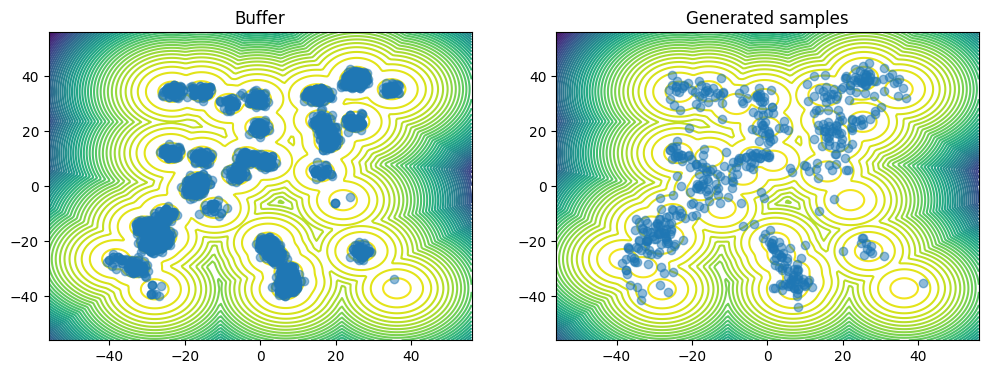

 16%|█▌        | 16/100 [09:58<53:25, 38.16s/it]

Epoch 0 | Loss 135.300140
Epoch 49 | Loss 146.591019
Epoch 98 | Loss 111.037888


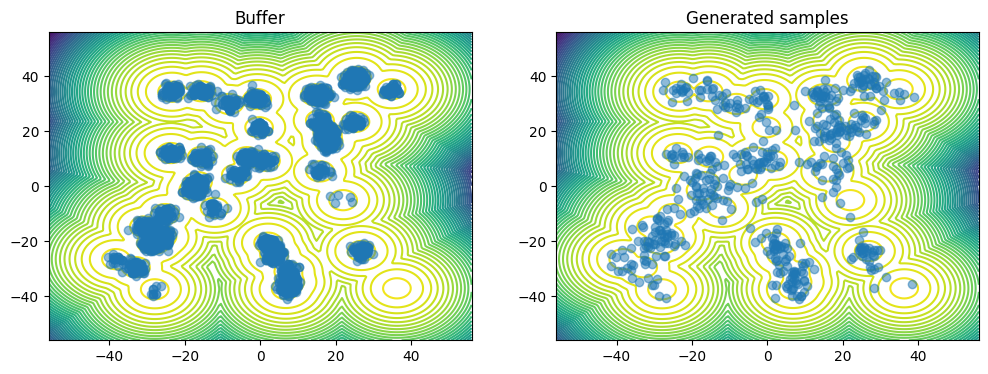

 17%|█▋        | 17/100 [10:36<52:48, 38.17s/it]

Epoch 0 | Loss 126.641869
Epoch 49 | Loss 152.644760
Epoch 98 | Loss 112.453751


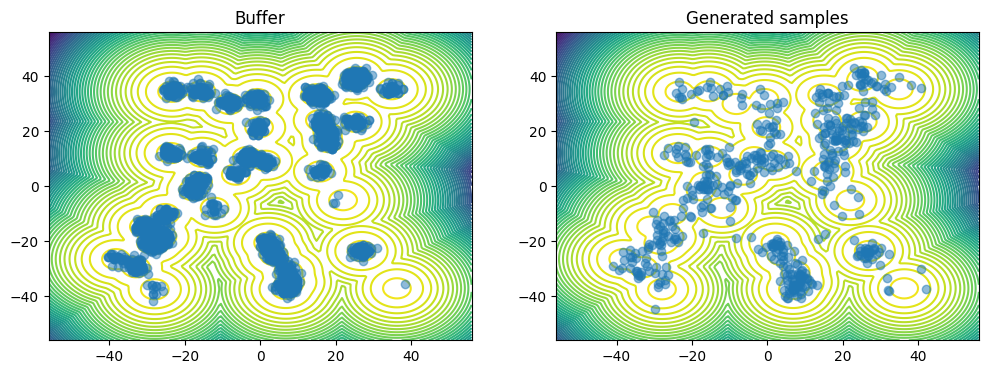

 18%|█▊        | 18/100 [11:14<52:12, 38.20s/it]

Epoch 0 | Loss 149.139435
Epoch 49 | Loss 118.969269
Epoch 98 | Loss 251.535217


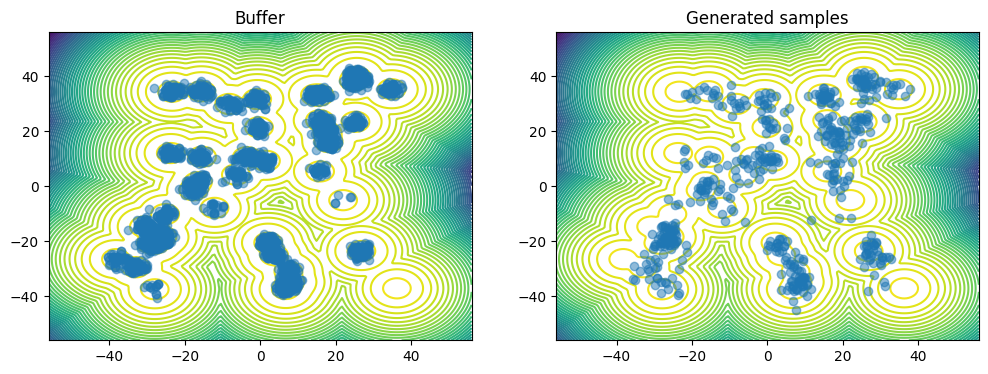

 19%|█▉        | 19/100 [11:52<51:31, 38.17s/it]

Epoch 0 | Loss 194.027283
Epoch 49 | Loss 125.033142
Epoch 98 | Loss 204.358856


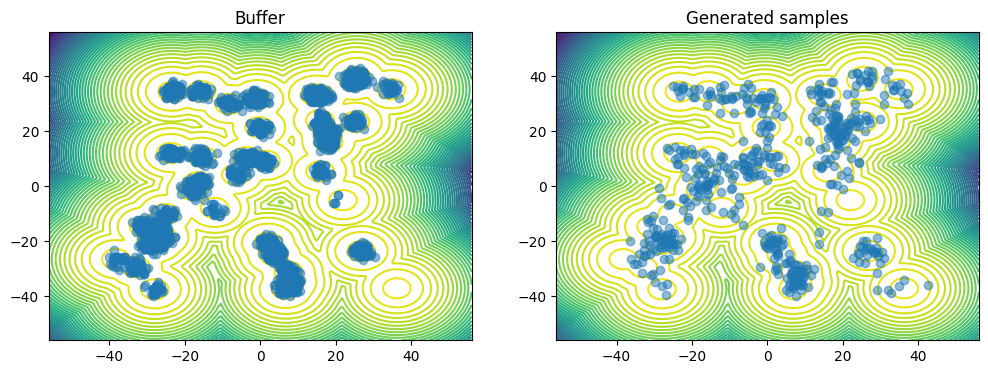

 20%|██        | 20/100 [12:31<51:05, 38.32s/it]

Epoch 0 | Loss 166.745087
Epoch 49 | Loss 122.919746
Epoch 98 | Loss 100.306656


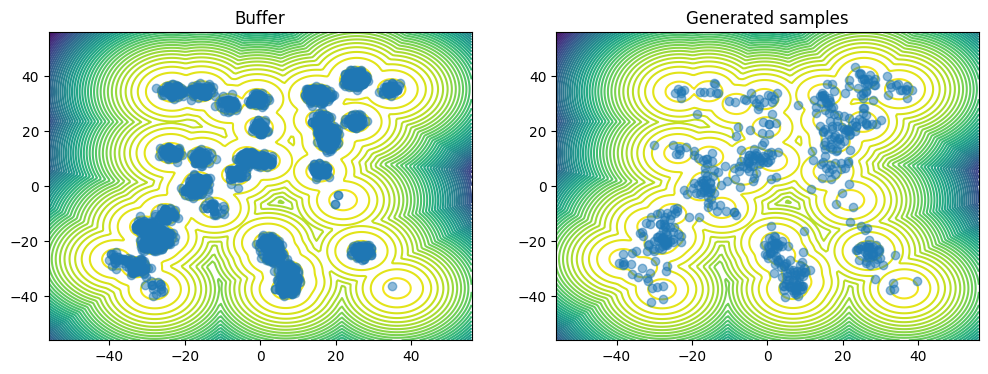

 21%|██        | 21/100 [13:10<50:37, 38.44s/it]

Epoch 0 | Loss 112.303345
Epoch 49 | Loss 218.404938
Epoch 98 | Loss 257.226318


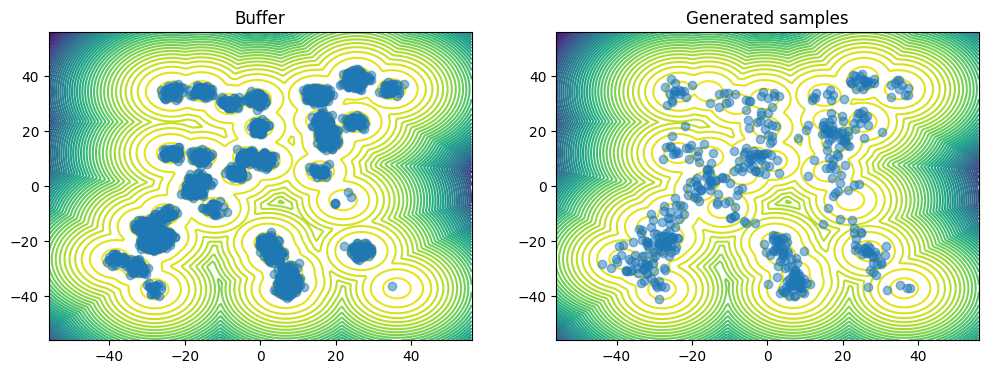

 22%|██▏       | 22/100 [13:48<50:03, 38.50s/it]

Epoch 0 | Loss 150.167374
Epoch 49 | Loss 237.336548
Epoch 98 | Loss 329.369385


 22%|██▏       | 22/100 [14:11<50:19, 38.71s/it]


KeyboardInterrupt: 

In [ ]:
outer_epochs= 100
inner_epochs = 100

num_samples = 2048 

train_dataset = TensorDataset(x1_samples_normalized.clone(), x1_energy.clone())
trainloader = DataLoader(train_dataset, batch_size = 512, shuffle=True) 
global_mins, global_maxs = global_mins_init, global_maxs_init


for epoch in tqdm(range(outer_epochs)):
    for epoch in range(inner_epochs):
        total_loss = 0.
        for samples,_ in trainloader:
            samples = samples.to(device)
            opt_vectorfield.zero_grad()
            # t = torch.rand(len(samples), device=device)

            # 80 % sample from (0, 0.1), 20% sample from (0.1, 1)
            # x0 is data
            low_time_t = (-0.1 * torch.rand(len(samples), device=device)) + 0.1
            high_time_t = (-0.9 * torch.rand(len(samples), device=device)) + 1.0
            
            mask = torch.rand(len(samples), device=device) < 0.8
            
            t = (low_time_t * mask) + (high_time_t * ~mask)

            loss = reward_matching_loss_biased(vectorfield, samples, t, beta)
            total_loss += loss.item()
            loss.backward()
            opt_vectorfield.step()
        if epoch % 49 == 0:
            print("Epoch %d | Loss %f" % (epoch, loss.item()))


    # Generate samples using the vector field
    ve_reverse_sde = VEReverseSDE(vectorfield, beta)
    generate_samples(ve_reverse_sde, x1_samples_normalized)
    samples = generate_samples(ve_reverse_sde, x1_samples_normalized)[-1]
    samples_energy = target.log_prob(unnormalize(samples, global_mins, global_maxs)).detach()

    # Update Buffer 
    buffer.add(samples, samples_energy)

    plot_dataset(unnormalize(train_dataset.tensors[0], global_mins, global_maxs), 
                 unnormalize(samples, global_mins, global_maxs))
    plt.show()
    # Resample data from the buffer
    samples, samples_energy, _ = buffer.sample(512 * 10)
    train_dataset = TensorDataset(samples, samples_energy)
    trainloader = DataLoader(train_dataset, batch_size = 512, shuffle=True)